In [ ]:
# importing car object detection dataset from Kaggle Library

import kagglehub
sshikamaru_car_object_detection_path = kagglehub.dataset_download('sshikamaru/car-object-detection')

print('Data source import complete.')

100%|██████████| 112M/112M [00:06<00:00, 19.5MB/s]

Extracting files...


Data source import complete.


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# using OS level directory traversing to display the list of images from training and test directories of the dataset
import os
for dirname, _, filenames in os.walk('/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/sample_submission.csv
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/train_solution_bounding_boxes (1).csv
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29560.jpg
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_28620.jpg
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29440.jpg
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_30120.jpg
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29540.jpg
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_28020.jpg
/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27260.jpg
/ro

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.8/898.8 kB 50.3 MB/s eta 0:00:00


In [ ]:
# Install and import python libraries

!pip install -U ipywidgets
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt # pyplot for plotting
import seaborn as sns   # seaborn for plotting
from sklearn.model_selection import train_test_split
from glob import glob
import cv2
from PIL import Image
from ultralytics import YOLO
import os

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# creating directories for working session and training model

!mkdir -p "/content/working/data"
!mkdir -p "/content/working/data/images"
!mkdir -p "/content/working/data/images/train"
!mkdir -p "/content/working/data/images/val"
!mkdir -p "/content/working/data/labels"
!mkdir -p "/content/working/data/labels/train"
!mkdir -p "/content/working/data/labels/val"

root_dir = "/content/working/data"
labels_dir = "/content/working/data/labels"
images_dir = "/content/working/data/images"

In [ ]:
train_data = "/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/training_images"
csv_data = "/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/train_solution_bounding_boxes (1).csv"
test_data = "/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images"

In [ ]:
# Read the input dataset and display first few records

df = pd.read_csv(csv_data)
df.head()

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422


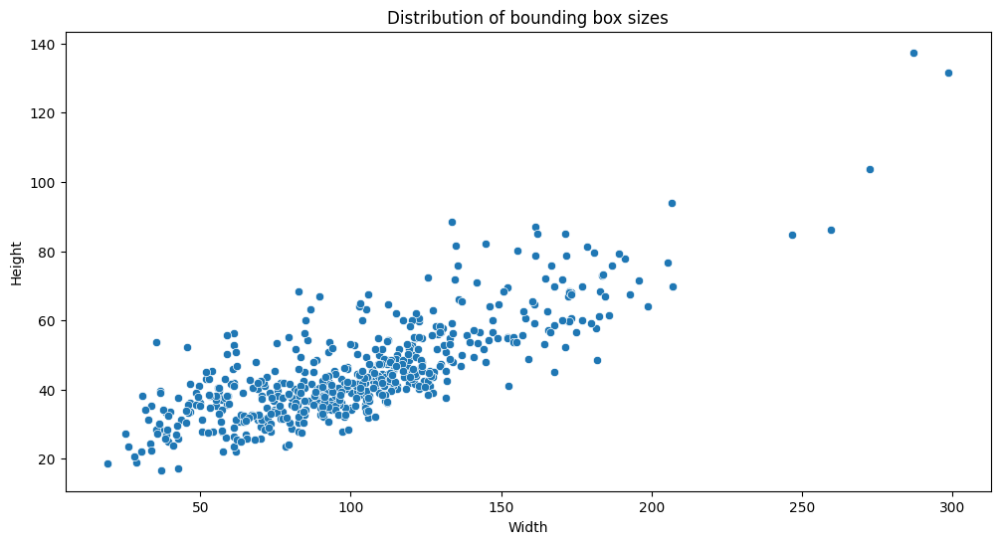

In [ ]:
# Plotting for distribution of height and width of cars in the input dataset

plt.figure(figsize=(12, 6))
df['width'] = df['xmax'] - df['xmin']
df['height'] = df['ymax'] - df['ymin']
sns.scatterplot(x='width', y='height', data=df)
plt.title('Distribution of bounding box sizes')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()

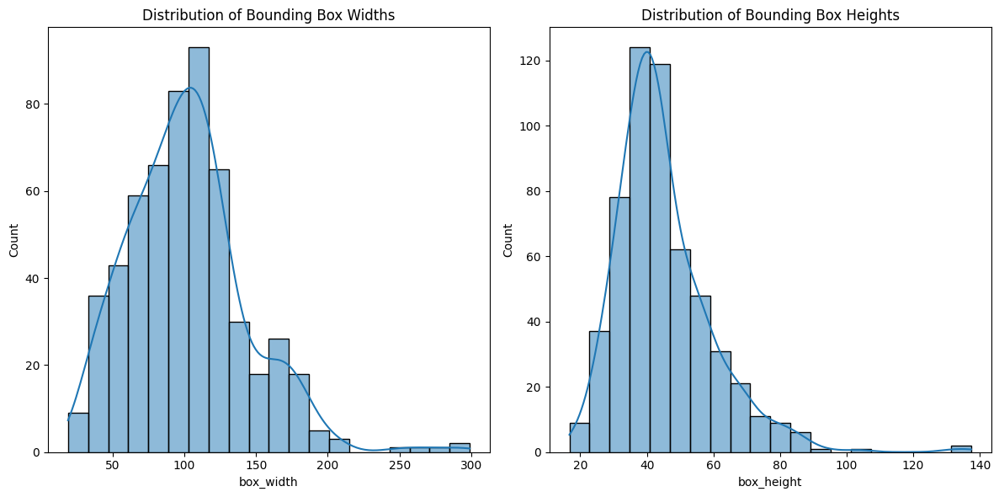

In [ ]:
#Plotting for bounding box width and height of the cars

df['box_width'] = df['xmax'] - df['xmin']
df['box_height'] = df['ymax'] - df['ymin']

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(df['box_width'], bins=20, kde=True)
plt.title('Distribution of Bounding Box Widths')

plt.subplot(1, 2, 2)
sns.histplot(df['box_height'], bins=20, kde=True)
plt.title('Distribution of Bounding Box Heights')

plt.tight_layout();
plt.show();

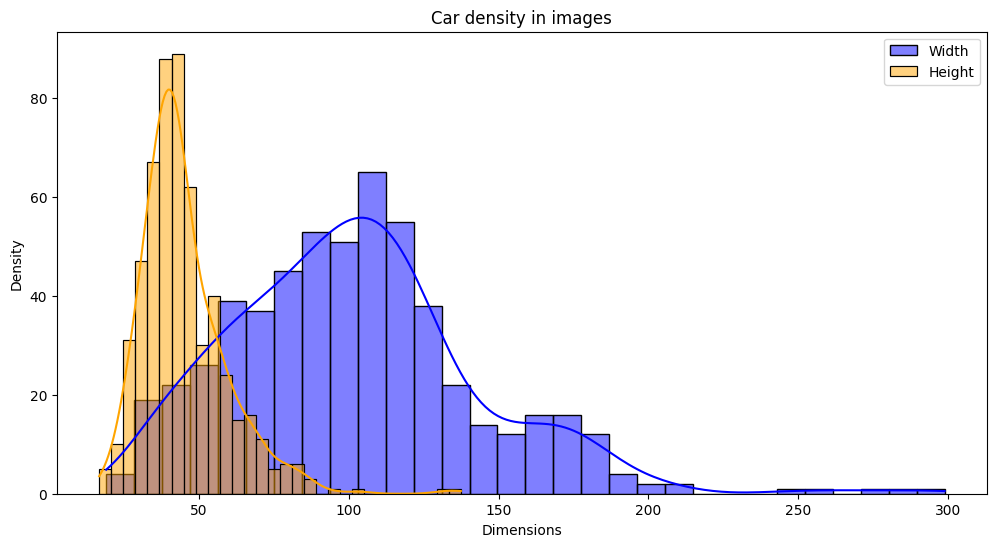

In [ ]:
#Plotting density of cars found in the images

plt.figure(figsize=(12, 6))
sns.histplot(df['width'], bins=30, kde=True, color='blue', label='Width')
sns.histplot(df['height'], bins=30, kde=True, color='orange', label='Height')
plt.title('Car density in images')
plt.xlabel('Dimensions')
plt.ylabel('Density')
plt.legend()
plt.show()

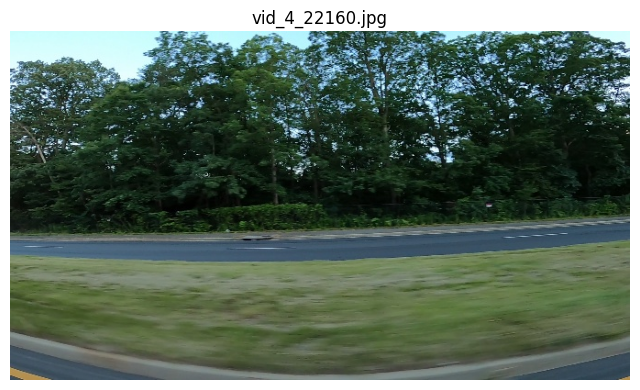

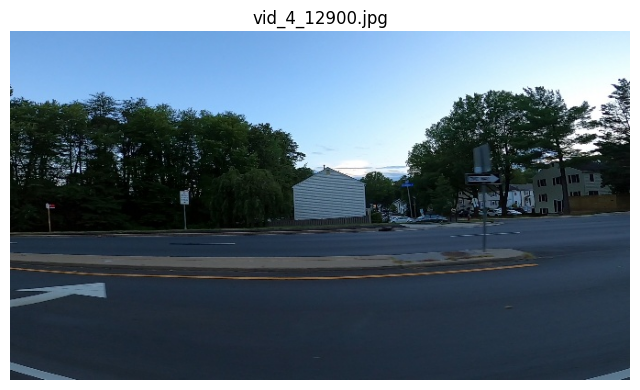

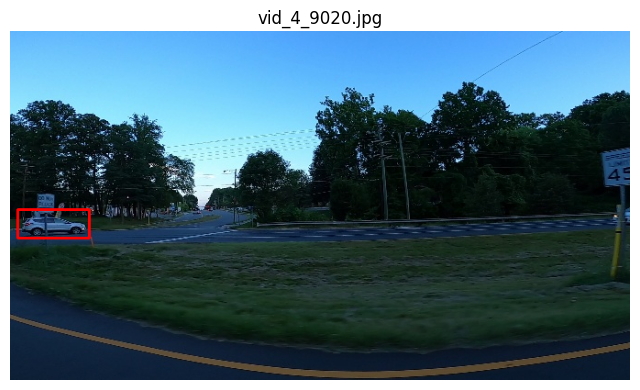

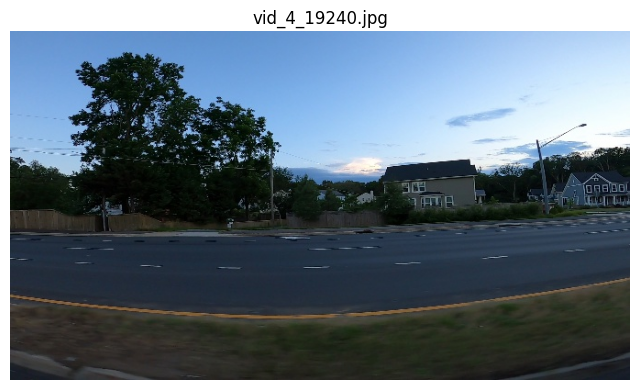

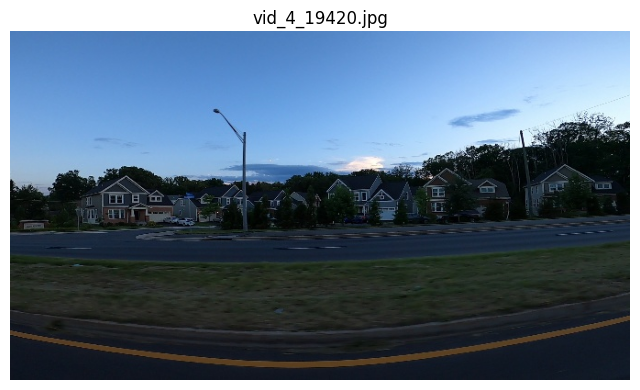

...

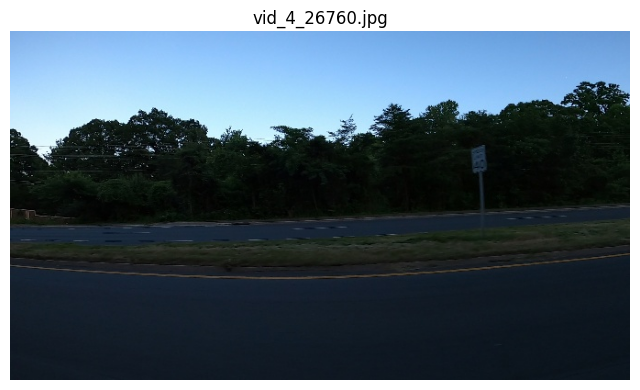

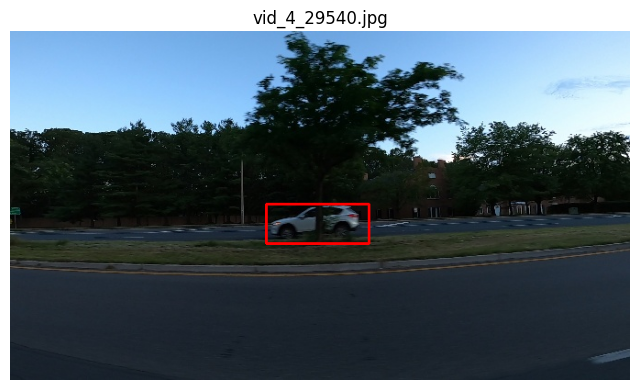

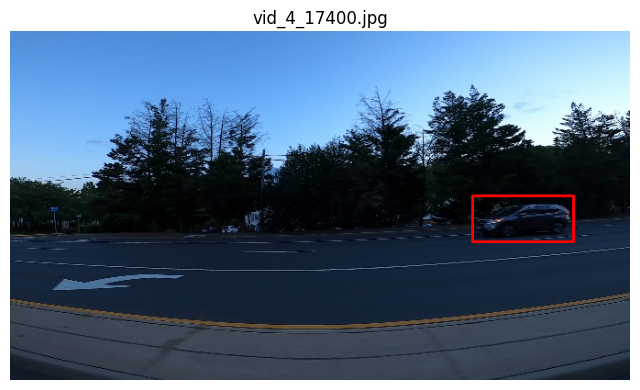

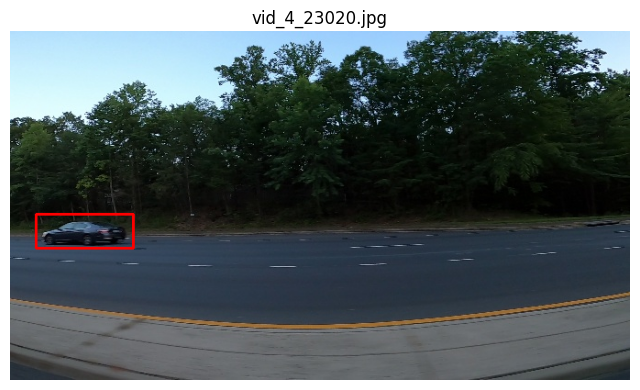

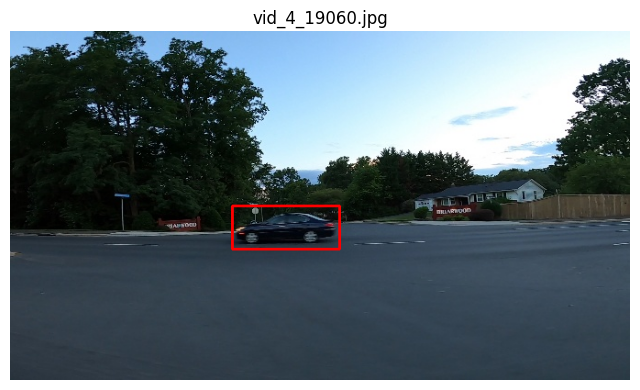

In [ ]:
#Identifying and displaying cars in the input dataset
#The images are in RGB format.

def plot_images_with_boxes(image_path, df, n=12):
    images = glob(f'{image_path}/*.jpg')[:n]
    for img_path in images:
        img = cv2.imread(img_path)
        img_name = os.path.basename(img_path)
        boxes = df[df['image'] == img_name]

        for _, box in boxes.iterrows():
            cv2.rectangle(img,
                          (int(box['xmin']), int(box['ymin'])),
                          (int(box['xmax']), int(box['ymax'])),
                          (0,0,255),2)

        plt.figure(figsize=(8, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(img_name)
        plt.axis('off')
        plt.show()
plot_images_with_boxes(train_data, df)

In [ ]:
def create_yolo_annotation(row, img_width, img_height):
    x_center = ((row['xmin'] + row['xmax']) / 2) / img_width
    y_center = ((row['ymin'] + row['ymax']) / 2) / img_height
    width = (row['xmax'] - row['xmin']) / img_width
    height = (row['ymax'] - row['ymin']) / img_height
    return f"0 {x_center} {y_center} {width} {height}"

In [ ]:
for img_name in df['image'].unique():
    img_df = df[df['image'] == img_name]
    img_path = os.path.join(train_data,img_name)
    img = cv2.imread(img_path)
    if img is not None:
        img_height, img_width = img.shape[:2]

        if np.random.rand() < 0.8:
            subset = "train"
        else:
            subset = "val"

        dst_img_path = os.path.join(images_dir, subset, img_name)
        cv2.imwrite(dst_img_path, img)

        annotation_path = os.path.join(labels_dir, subset, f"{img_name.split('.')[0]}.txt")
        with open(annotation_path, 'w') as f:
            for _, row in img_df.iterrows():
                yolo_annotation = create_yolo_annotation(row, img_width, img_height)
                f.write(yolo_annotation + '\n')

In [ ]:
#YAML configuration for YOLO model training

yaml_content = f"""
path: {root_dir}
train: images/train
val: images/val

nc: 1
names: ['car']
"""
with open('car_detection.yaml', 'w') as f:
    f.write(yaml_content)
print("YAML configuration file created.")

YAML configuration file created.


In [ ]:
#selecting the YOLO pre-training model for training against our dataset

model = YOLO('yolov8s.pt')

100%|██████████| 21.5M/21.5M [00:00<00:00, 364MB/s]


In [ ]:
# Trainng the model with 100 epochs and storing the results

results = model.train(
    data='car_detection.yaml',
    epochs=100,
    imgsz=640,
    batch=16,
    name='car_detection_model'
)

Ultralytics 8.3.48 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=car_detection.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=car_detection_model, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, sho

100%|██████████| 755k/755k [00:00<00:00, 105MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 317MB/s]


AMP: checks passed ✅


train: Scanning /content/working/data/labels/train... 286 images, 0 backgrounds, 0 corrupt: 100%|██████████| 286/286 [00:00<00:00, 1833.08it/s]

train: New cache created: /content/working/data/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/working/data/labels/val... 69 images, 0 backgrounds, 0 corrupt: 100%|██████████| 69/69 [00:00<00:00, 1324.63it/s]

val: New cache created: /content/working/data/labels/val.cache


Plotting labels to runs/detect/car_detection_model/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/car_detection_model
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      4.05G      1.616      2.349      1.255         49        640: 100%|██████████| 18/18 [00:07<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.00s/it]

                   all         69        116      0.919      0.877      0.927       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.06G      1.254     0.9383      1.081         50        640: 100%|██████████| 18/18 [00:05<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.38it/s]

                   all         69        116      0.178      0.948      0.179      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      3.87G      1.345     0.9726      1.127         47        640: 100%|██████████| 18/18 [00:05<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.95it/s]

                   all         69        116      0.831      0.948      0.895      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.86G      1.278     0.7994      1.113         44        640: 100%|██████████| 18/18 [00:07<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.40it/s]

                   all         69        116      0.804      0.567      0.637      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.02G      1.294     0.8087      1.118         34        640: 100%|██████████| 18/18 [00:05<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.83it/s]

                   all         69        116      0.813      0.905      0.934      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.03G       1.25     0.7579      1.117         40        640: 100%|██████████| 18/18 [00:07<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.67it/s]

                   all         69        116      0.929      0.905      0.939      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      4.02G      1.297     0.7307      1.113         36        640: 100%|██████████| 18/18 [00:05<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.17it/s]

                   all         69        116      0.871      0.543      0.668      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.04G      1.271     0.6946      1.132         49        640: 100%|██████████| 18/18 [00:06<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.42it/s]

                   all         69        116      0.933      0.914      0.953      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.02G      1.274     0.6863      1.132         45        640: 100%|██████████| 18/18 [00:05<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.42it/s]

                   all         69        116      0.982      0.965      0.984      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.02G      1.234     0.6483      1.101         31        640: 100%|██████████| 18/18 [00:05<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.39it/s]

                   all         69        116      0.902      0.871      0.923      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         4G      1.218     0.6387      1.091         37        640: 100%|██████████| 18/18 [00:05<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.37it/s]

                   all         69        116      0.987       0.94      0.976      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.89G      1.249     0.6603      1.108         37        640: 100%|██████████| 18/18 [00:05<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.47it/s]

                   all         69        116      0.932      0.941      0.975      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.84G      1.252     0.6618      1.101         46        640: 100%|██████████| 18/18 [00:07<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.29it/s]

                   all         69        116      0.908      0.966      0.973      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.87G      1.187     0.6452      1.081         28        640: 100%|██████████| 18/18 [00:05<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.94it/s]

                   all         69        116      0.966      0.957      0.975      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      4.02G      1.167     0.6113      1.069         51        640: 100%|██████████| 18/18 [00:07<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.01it/s]


                   all         69        116      0.957      0.957       0.97      0.623

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.86G      1.196     0.6092       1.07         42        640: 100%|██████████| 18/18 [00:05<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.41it/s]

                   all         69        116      0.963      0.974      0.987      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.84G      1.165     0.5958      1.069         49        640: 100%|██████████| 18/18 [00:05<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.01it/s]

                   all         69        116      0.965      0.956      0.975      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      4.03G      1.188     0.5895      1.065         34        640: 100%|██████████| 18/18 [00:05<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.40it/s]

                   all         69        116      0.954      0.948      0.982      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         4G      1.167     0.5908      1.056         37        640: 100%|██████████| 18/18 [00:05<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.48it/s]

                   all         69        116      0.974      0.974       0.98      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      3.87G      1.172     0.5751      1.059         32        640: 100%|██████████| 18/18 [00:07<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.30it/s]

                   all         69        116       0.97      0.966       0.99      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         4G      1.121      0.572      1.063         53        640: 100%|██████████| 18/18 [00:05<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.49it/s]

                   all         69        116      0.974      0.966      0.987      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      4.05G      1.139      0.568      1.071         46        640: 100%|██████████| 18/18 [00:07<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.11it/s]

                   all         69        116      0.957      0.966       0.98      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      4.02G       1.13     0.5732      1.056         34        640: 100%|██████████| 18/18 [00:05<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.79it/s]

                   all         69        116      0.936      0.957      0.975       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      4.02G      1.141      0.572      1.066         47        640: 100%|██████████| 18/18 [00:05<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.29it/s]

                   all         69        116      0.949      0.954       0.97        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      4.02G      1.142     0.5681      1.062         47        640: 100%|██████████| 18/18 [00:05<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.79it/s]

                   all         69        116      0.958       0.98      0.981      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.03G      1.092     0.5567      1.059         39        640: 100%|██████████| 18/18 [00:05<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.68it/s]

                   all         69        116      0.979      0.983      0.988      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      4.02G      1.135     0.5527      1.059         31        640: 100%|██████████| 18/18 [00:07<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.54it/s]

                   all         69        116      0.974      0.982      0.983      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      4.05G      1.092     0.5381      1.052         40        640: 100%|██████████| 18/18 [00:05<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.64it/s]

                   all         69        116      0.972      0.974      0.984      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      4.02G      1.088      0.531       1.05         39        640: 100%|██████████| 18/18 [00:07<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.06it/s]

                   all         69        116      0.974       0.96      0.986      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      4.04G       1.13       0.55      1.066         27        640: 100%|██████████| 18/18 [00:05<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.39it/s]

                   all         69        116      0.966      0.966      0.988      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         4G      1.106     0.5416      1.052         27        640: 100%|██████████| 18/18 [00:05<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.12it/s]

                   all         69        116      0.964      0.974      0.985      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      4.04G      1.099     0.5234      1.032         45        640: 100%|██████████| 18/18 [00:06<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.08it/s]

                   all         69        116      0.966      0.974      0.982      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      4.01G      1.115     0.5347      1.048         49        640: 100%|██████████| 18/18 [00:05<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.21it/s]

                   all         69        116      0.966      0.974      0.981      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      4.03G      1.054     0.5152       1.03         48        640: 100%|██████████| 18/18 [00:07<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.54it/s]

                   all         69        116      0.941      0.956      0.968      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         4G      1.099     0.5213      1.037         37        640: 100%|██████████| 18/18 [00:05<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.22it/s]

                   all         69        116      0.953      0.931      0.971      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      3.87G      1.086     0.5293       1.03         31        640: 100%|██████████| 18/18 [00:07<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.99it/s]

                   all         69        116      0.974      0.931      0.986      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      4.02G      1.097     0.5237      1.049         38        640: 100%|██████████| 18/18 [00:05<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.21it/s]

                   all         69        116      0.965      0.974      0.988      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      3.89G      1.059     0.5133      1.028         38        640: 100%|██████████| 18/18 [00:06<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.32it/s]

                   all         69        116      0.958       0.98      0.986      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      4.02G       1.02     0.5034      1.007         49        640: 100%|██████████| 18/18 [00:05<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.41it/s]

                   all         69        116      0.969      0.966      0.985      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      4.06G      1.052     0.5021      1.025         47        640: 100%|██████████| 18/18 [00:05<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all         69        116      0.965      0.983      0.984      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100         4G      1.006     0.4948      1.014         39        640: 100%|██████████| 18/18 [00:06<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.22it/s]

                   all         69        116      0.974      0.983      0.984       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.87G      1.062     0.5028      1.035         43        640: 100%|██████████| 18/18 [00:05<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.12it/s]

                   all         69        116      0.952      0.974      0.981      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      4.02G      1.068     0.5052      1.042         53        640: 100%|██████████| 18/18 [00:07<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.23it/s]

                   all         69        116      0.974      0.977      0.988      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      4.04G       1.04     0.4919      1.018         30        640: 100%|██████████| 18/18 [00:05<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.12it/s]

                   all         69        116      0.981      0.983      0.993      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      4.02G       1.02     0.4912      1.011         51        640: 100%|██████████| 18/18 [00:06<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.08it/s]

                   all         69        116      0.982      0.983      0.989      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      3.87G      1.008       0.48      1.013         40        640: 100%|██████████| 18/18 [00:05<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.75it/s]

                   all         69        116      0.983       0.98      0.986      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      4.02G      1.017     0.4888      1.005         54        640: 100%|██████████| 18/18 [00:05<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.00it/s]

                   all         69        116      0.974      0.978      0.987      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      4.03G      1.028     0.4796      1.019         34        640: 100%|██████████| 18/18 [00:05<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.73it/s]

                   all         69        116      0.974      0.983      0.988      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100         4G      1.012     0.4787      1.007         29        640: 100%|██████████| 18/18 [00:05<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.80it/s]

                   all         69        116      0.973      0.983      0.988      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      3.87G     0.9699     0.4725     0.9913         31        640: 100%|██████████| 18/18 [00:06<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.71it/s]

                   all         69        116      0.973      0.983      0.986      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100         4G     0.9789     0.4664      1.003         33        640: 100%|██████████| 18/18 [00:05<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.38it/s]

                   all         69        116      0.966      0.974       0.98       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      4.04G     0.9465     0.4522     0.9845         34        640: 100%|██████████| 18/18 [00:07<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all         69        116      0.978      0.983      0.985      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      4.02G     0.9784      0.471      1.001         42        640: 100%|██████████| 18/18 [00:05<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.12it/s]

                   all         69        116      0.981      0.983      0.984      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      4.04G     0.9559     0.4621     0.9852         34        640: 100%|██████████| 18/18 [00:06<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.13it/s]

                   all         69        116      0.981      0.983       0.99      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100         4G     0.9877     0.4771     0.9948         39        640: 100%|██████████| 18/18 [00:05<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.79it/s]

                   all         69        116      0.981      0.983       0.99      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      4.05G     0.9698     0.4669      1.002         47        640: 100%|██████████| 18/18 [00:05<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.02it/s]

                   all         69        116      0.981      0.974      0.987      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100         4G     0.9493     0.4548      1.005         52        640: 100%|██████████| 18/18 [00:07<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.06it/s]

                   all         69        116      0.982      0.974       0.99      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      3.88G     0.9412     0.4603      1.004         39        640: 100%|██████████| 18/18 [00:05<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.50it/s]

                   all         69        116      0.989      0.974      0.987      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.01G     0.9201     0.4411     0.9808         41        640: 100%|██████████| 18/18 [00:07<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.52it/s]

                   all         69        116      0.991      0.973      0.987      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      4.05G     0.9151     0.4446     0.9738         34        640: 100%|██████████| 18/18 [00:05<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.62it/s]

                   all         69        116      0.983       0.98      0.988      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100         4G     0.9147     0.4391     0.9759         39        640: 100%|██████████| 18/18 [00:06<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.91it/s]

                   all         69        116      0.982      0.983      0.992      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100       3.9G     0.9517     0.4523     0.9847         23        640: 100%|██████████| 18/18 [00:05<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.45it/s]

                   all         69        116      0.981      0.983      0.989      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      4.01G     0.8774     0.4319     0.9641         41        640: 100%|██████████| 18/18 [00:05<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all         69        116      0.981      0.983      0.985       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      3.86G     0.9123     0.4342     0.9779         46        640: 100%|██████████| 18/18 [00:06<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.30it/s]

                   all         69        116      0.982      0.983      0.988      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      4.01G     0.9025     0.4418     0.9729         39        640: 100%|██████████| 18/18 [00:05<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.08it/s]

                   all         69        116       0.98      0.983      0.988      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      3.89G     0.8923     0.4385     0.9678         32        640: 100%|██████████| 18/18 [00:07<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.69it/s]

                   all         69        116      0.983      0.981      0.989       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100         4G     0.8953     0.4252     0.9685         37        640: 100%|██████████| 18/18 [00:05<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.74it/s]

                   all         69        116      0.973      0.983      0.988      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      3.87G     0.8517     0.4182     0.9599         43        640: 100%|██████████| 18/18 [00:06<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.09it/s]


                   all         69        116      0.972      0.974      0.979      0.685

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100         4G     0.8577     0.4088     0.9492         49        640: 100%|██████████| 18/18 [00:05<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.09it/s]

                   all         69        116      0.972      0.983       0.98      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      3.87G     0.8907     0.4144     0.9673         46        640: 100%|██████████| 18/18 [00:05<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.65it/s]

                   all         69        116      0.983      0.983      0.982      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      4.02G     0.8544     0.4151      0.948         38        640: 100%|██████████| 18/18 [00:06<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.62it/s]

                   all         69        116      0.991      0.982      0.986      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      4.04G      0.834      0.404     0.9539         38        640: 100%|██████████| 18/18 [00:05<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.04it/s]

                   all         69        116      0.983      0.982      0.986      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100         4G     0.9008     0.4255     0.9641         44        640: 100%|██████████| 18/18 [00:07<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all         69        116       0.98      0.983      0.984      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      4.03G     0.8469     0.4074     0.9441         40        640: 100%|██████████| 18/18 [00:05<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.56it/s]

                   all         69        116      0.981      0.983      0.985      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      4.02G      0.823     0.3962     0.9469         29        640: 100%|██████████| 18/18 [00:06<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.18it/s]

                   all         69        116      0.983      0.982      0.984      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      3.89G     0.8385     0.3981     0.9521         41        640: 100%|██████████| 18/18 [00:05<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.91it/s]

                   all         69        116      0.983      0.981      0.983      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      4.02G     0.8199     0.3983     0.9514         42        640: 100%|██████████| 18/18 [00:05<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.36it/s]


                   all         69        116       0.98      0.983      0.981      0.696

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      3.87G     0.8126      0.388     0.9396         31        640: 100%|██████████| 18/18 [00:06<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.44it/s]

                   all         69        116      0.981      0.983      0.979        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      3.98G     0.7746     0.3771     0.9419         44        640: 100%|██████████| 18/18 [00:05<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.45it/s]

                   all         69        116      0.982      0.983       0.98      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      4.03G     0.7915     0.3873     0.9419         32        640: 100%|██████████| 18/18 [00:07<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.15it/s]

                   all         69        116      0.974      0.983      0.981        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      4.02G     0.7859     0.3845     0.9254         45        640: 100%|██████████| 18/18 [00:05<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.75it/s]

                   all         69        116      0.974      0.982      0.981      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      4.05G     0.7734     0.3774     0.9289         34        640: 100%|██████████| 18/18 [00:07<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.22it/s]

                   all         69        116      0.974      0.983      0.987      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      3.85G     0.7828     0.3798     0.9345         40        640: 100%|██████████| 18/18 [00:05<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.32it/s]

                   all         69        116      0.973      0.983      0.988      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      3.87G     0.7763     0.3772     0.9317         42        640: 100%|██████████| 18/18 [00:05<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.37it/s]

                   all         69        116      0.982      0.983      0.989      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      4.01G     0.7766     0.3846     0.9359         21        640: 100%|██████████| 18/18 [00:06<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.73it/s]

                   all         69        116      0.982      0.983      0.988      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      4.03G     0.7584     0.3722      0.919         37        640: 100%|██████████| 18/18 [00:05<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.44it/s]

                   all         69        116      0.982      0.983      0.988      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      4.02G     0.7738     0.3831     0.9218         40        640: 100%|██████████| 18/18 [00:07<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.65it/s]

                   all         69        116      0.981      0.983      0.989      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      4.02G     0.7783     0.3762     0.9318         43        640: 100%|██████████| 18/18 [00:05<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.25it/s]

                   all         69        116      0.981      0.983       0.99      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      4.02G     0.7179     0.3603      0.908         38        640: 100%|██████████| 18/18 [00:07<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.87it/s]

                   all         69        116      0.982      0.983      0.982      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      4.04G     0.7224      0.357     0.9029         37        640: 100%|██████████| 18/18 [00:05<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.93it/s]

                   all         69        116      0.982      0.983      0.983      0.698


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100         4G     0.7348     0.3632     0.9151         15        640: 100%|██████████| 18/18 [00:08<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.51it/s]

                   all         69        116      0.982      0.983      0.982        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      4.03G     0.7577     0.3585     0.9139         16        640: 100%|██████████| 18/18 [00:05<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.97it/s]

                   all         69        116      0.982      0.983      0.988      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100         4G     0.7251     0.3528     0.9099         20        640: 100%|██████████| 18/18 [00:06<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.03it/s]

                   all         69        116      0.982      0.983      0.983      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      4.03G     0.7177      0.346     0.9155         22        640: 100%|██████████| 18/18 [00:05<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.75it/s]

                   all         69        116      0.982      0.983       0.99      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100         4G     0.7072     0.3436      0.917         24        640: 100%|██████████| 18/18 [00:05<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.30it/s]


                   all         69        116      0.982      0.983      0.989        0.7

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      3.87G     0.7071     0.3465      0.903         14        640: 100%|██████████| 18/18 [00:06<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.01it/s]

                   all         69        116      0.982      0.983      0.985        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100         4G     0.7062     0.3346     0.9013         17        640: 100%|██████████| 18/18 [00:05<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.92it/s]

                   all         69        116      0.982      0.983      0.985      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      3.87G     0.6814     0.3397     0.8879         18        640: 100%|██████████| 18/18 [00:07<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.18it/s]

                   all         69        116      0.982      0.983      0.984      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100         4G     0.6857      0.337     0.8925         18        640: 100%|██████████| 18/18 [00:05<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  5.14it/s]

                   all         69        116      0.982      0.983      0.989        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      3.87G      0.689     0.3392      0.905         24        640: 100%|██████████| 18/18 [00:06<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all         69        116      0.982      0.983      0.989      0.702



100 epochs completed in 0.224 hours.
Optimizer stripped from runs/detect/car_detection_model/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/car_detection_model/weights/best.pt, 22.5MB

Validating runs/detect/car_detection_model/weights/best.pt...
Ultralytics 8.3.48 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.18it/s]


                   all         69        116      0.974      0.983      0.984       0.71
Speed: 1.2ms preprocess, 3.3ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/car_detection_model


In [ ]:
# Printing the results from trained YOLO model

results = model.val()
print(results)

Ultralytics 8.3.48 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /content/working/data/labels/val.cache... 69 images, 0 backgrounds, 0 corrupt: 100%|██████████| 69/69 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.03it/s]


                   all         69        116      0.974      0.983      0.984      0.708
Speed: 0.3ms preprocess, 11.0ms inference, 0.0ms loss, 6.0ms postprocess per image
Results saved to runs/detect/car_detection_model2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f6c93e7be50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.0

In [ ]:
# mean of 50, 70, 95% precisions for the trained model

print(f"Mean Average Precision @.5:.95 : {results.box.map}")
print(f"Mean Average Precision @ .50   : {results.box.map50}")
print(f"Mean Average Precision @ .70   : {results.box.map75}")

Mean Average Precision @.5:.95 : 0.7084891262125815
Mean Average Precision @ .50   : 0.9840800025752203
Mean Average Precision @ .70   : 0.9059462480927479



image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29560.jpg: 384x640 1 car, 43.3ms
Speed: 3.2ms preprocess, 43.3ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


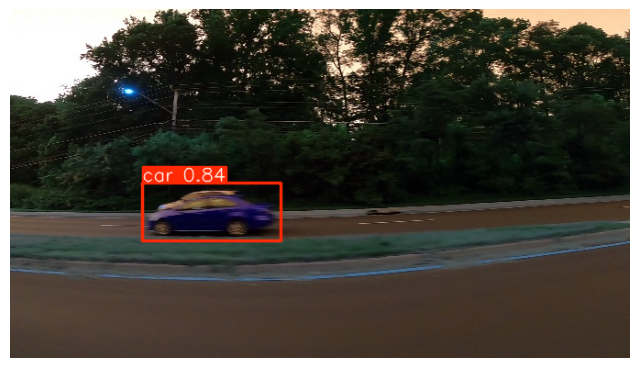


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_28620.jpg: 384x640 (no detections), 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


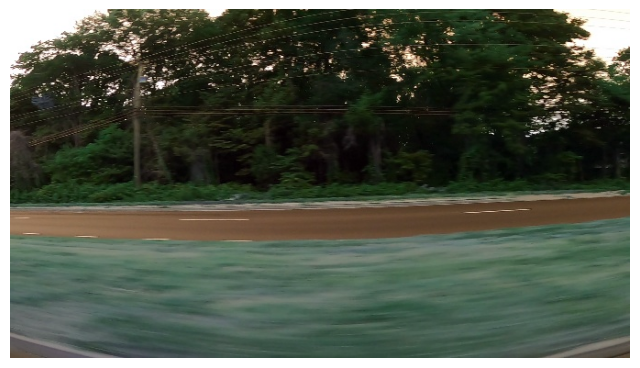


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29440.jpg: 384x640 2 cars, 10.6ms
Speed: 3.5ms preprocess, 10.6ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)


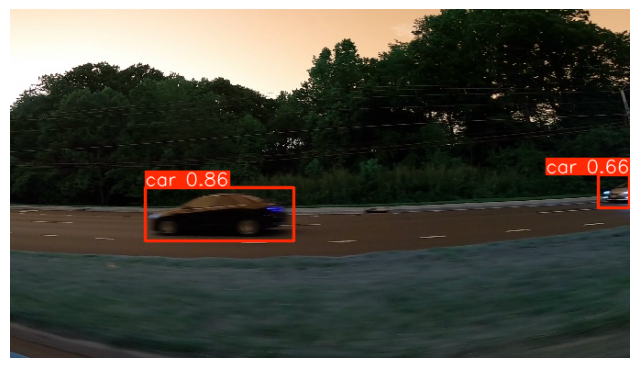


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_30120.jpg: 384x640 (no detections), 10.7ms
Speed: 2.6ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


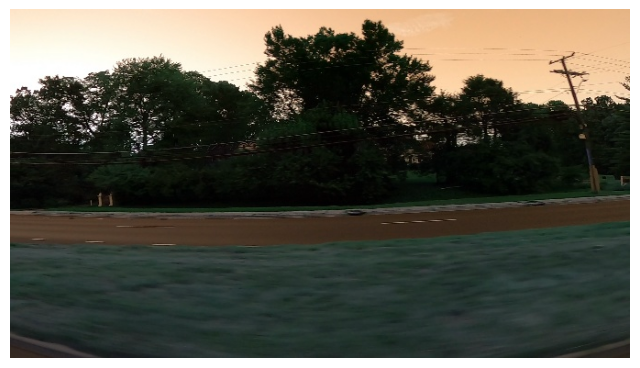


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29540.jpg: 384x640 2 cars, 10.6ms
Speed: 2.6ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


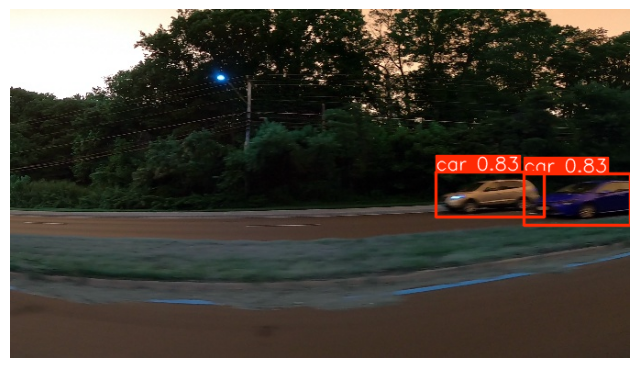


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_28020.jpg: 384x640 (no detections), 14.0ms
Speed: 4.8ms preprocess, 14.0ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


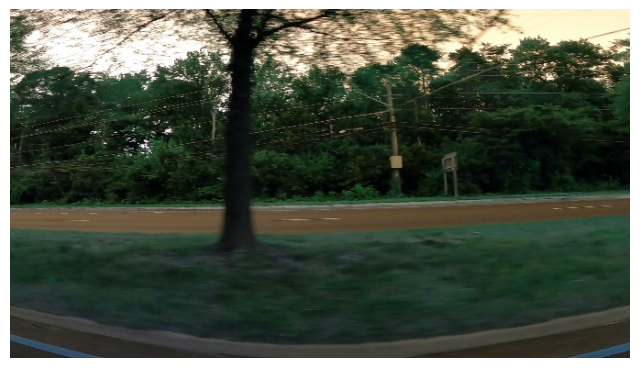


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27260.jpg: 384x640 (no detections), 10.7ms
Speed: 3.4ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


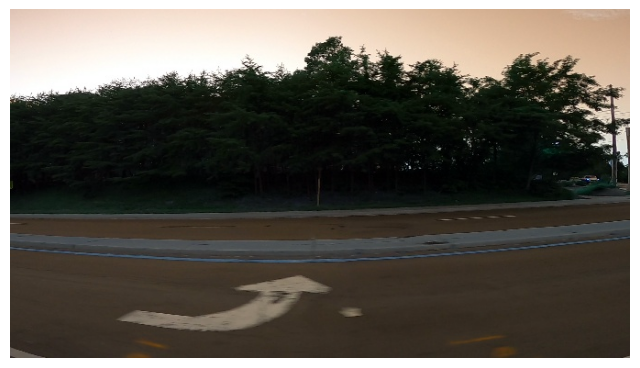


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_28560.jpg: 384x640 (no detections), 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


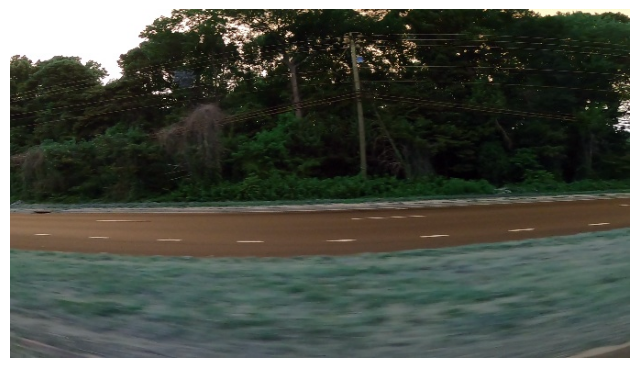


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29600.jpg: 384x640 (no detections), 15.5ms
Speed: 2.7ms preprocess, 15.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


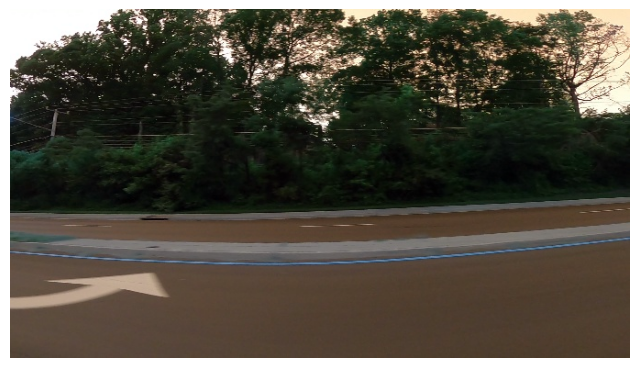


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27400.jpg: 384x640 3 cars, 15.0ms
Speed: 2.7ms preprocess, 15.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


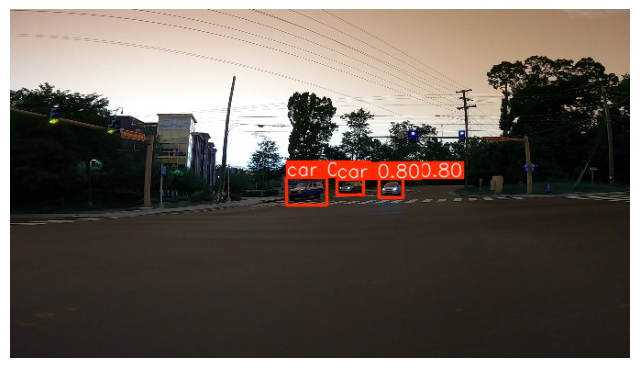


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_30160.jpg: 384x640 (no detections), 12.1ms
Speed: 2.7ms preprocess, 12.1ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


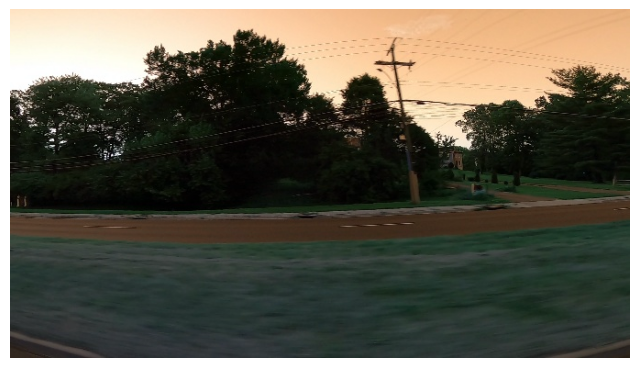


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_26620.jpg: 384x640 1 car, 15.6ms
Speed: 2.8ms preprocess, 15.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


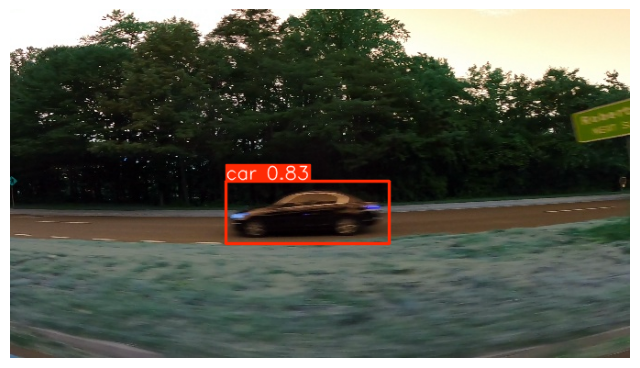


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27760.jpg: 384x640 (no detections), 14.1ms
Speed: 2.6ms preprocess, 14.1ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


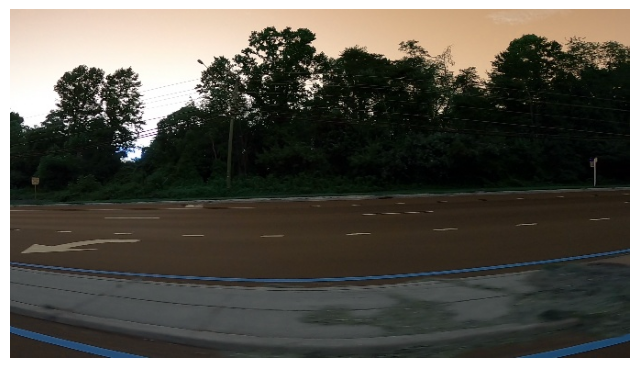


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29020.jpg: 384x640 1 car, 14.0ms
Speed: 2.7ms preprocess, 14.0ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


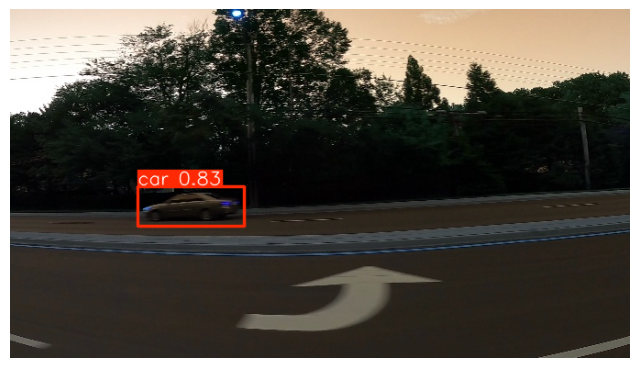


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29460.jpg: 384x640 1 car, 16.2ms
Speed: 2.9ms preprocess, 16.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


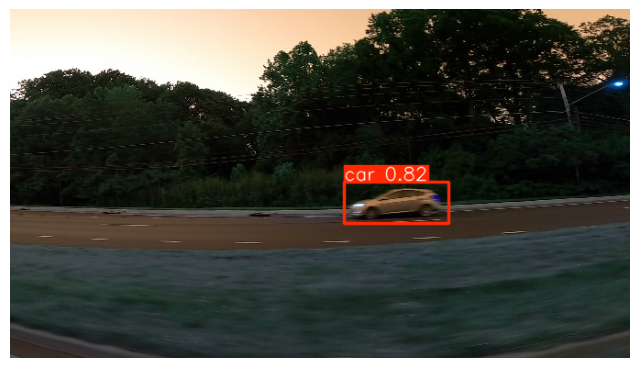


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27580.jpg: 384x640 (no detections), 12.9ms
Speed: 3.2ms preprocess, 12.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


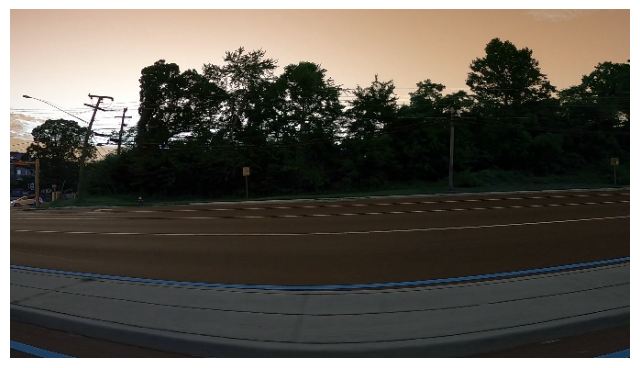


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_26840.jpg: 384x640 1 car, 13.5ms
Speed: 2.7ms preprocess, 13.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


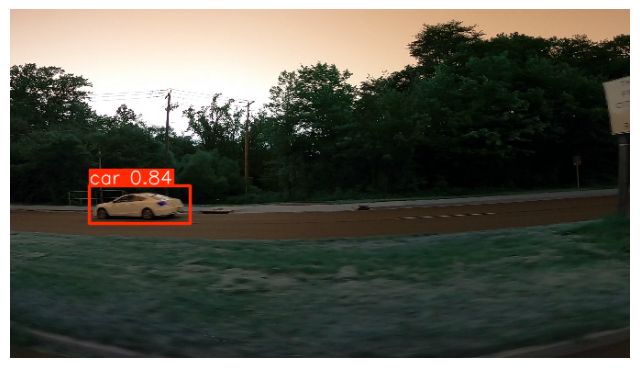


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27900.jpg: 384x640 1 car, 16.2ms
Speed: 2.7ms preprocess, 16.2ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


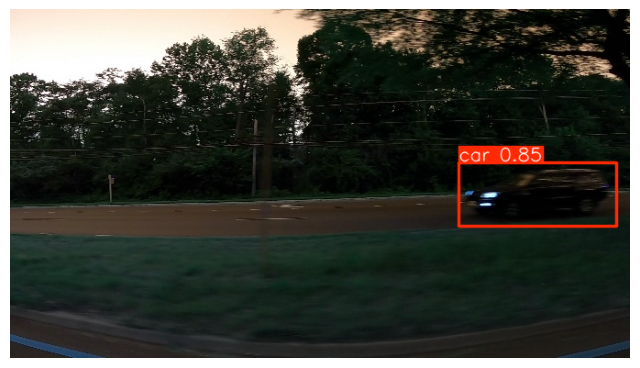


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27840.jpg: 384x640 1 car, 16.7ms
Speed: 2.9ms preprocess, 16.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


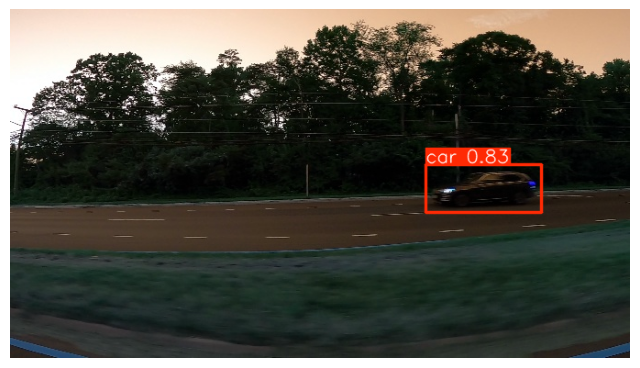


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27300.jpg: 384x640 2 cars, 15.9ms
Speed: 2.7ms preprocess, 15.9ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


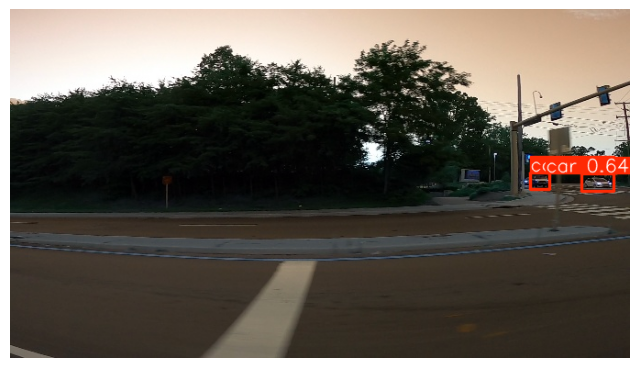


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29040.jpg: 384x640 1 car, 13.5ms
Speed: 2.7ms preprocess, 13.5ms inference, 5.9ms postprocess per image at shape (1, 3, 384, 640)


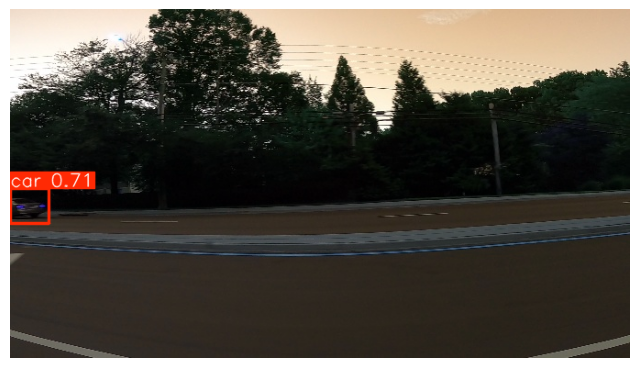


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_26940.jpg: 384x640 2 cars, 14.7ms
Speed: 2.6ms preprocess, 14.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


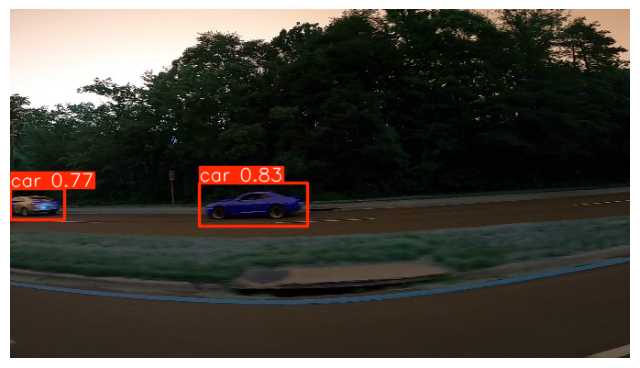


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_26880.jpg: 384x640 1 car, 15.2ms
Speed: 2.7ms preprocess, 15.2ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)


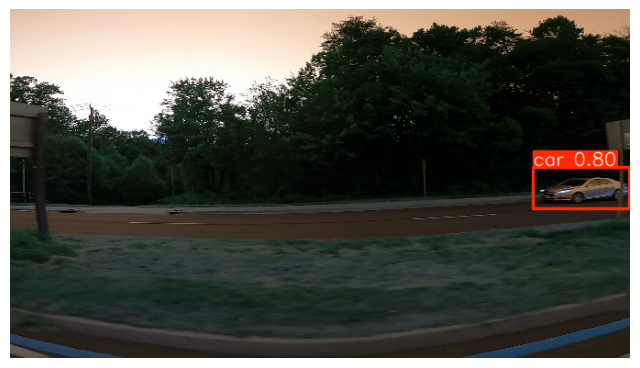


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27360.jpg: 384x640 2 cars, 13.1ms
Speed: 2.5ms preprocess, 13.1ms inference, 5.8ms postprocess per image at shape (1, 3, 384, 640)


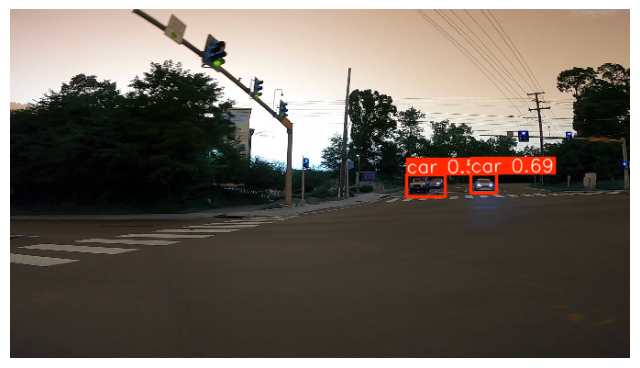


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27420.jpg: 384x640 3 cars, 12.6ms
Speed: 2.7ms preprocess, 12.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


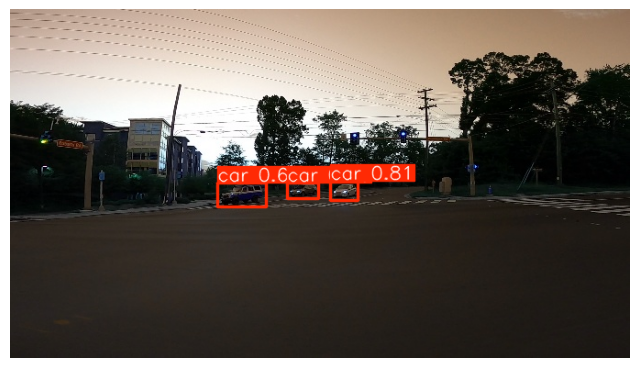


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27440.jpg: 384x640 3 cars, 11.5ms
Speed: 2.7ms preprocess, 11.5ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)


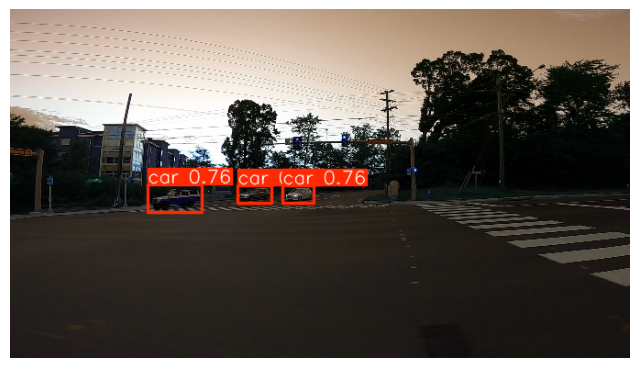


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_25200.jpg: 384x640 (no detections), 13.2ms
Speed: 2.7ms preprocess, 13.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


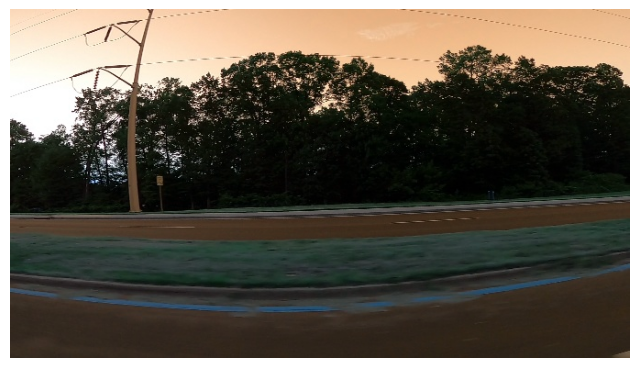


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29620.jpg: 384x640 (no detections), 12.5ms
Speed: 2.7ms preprocess, 12.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


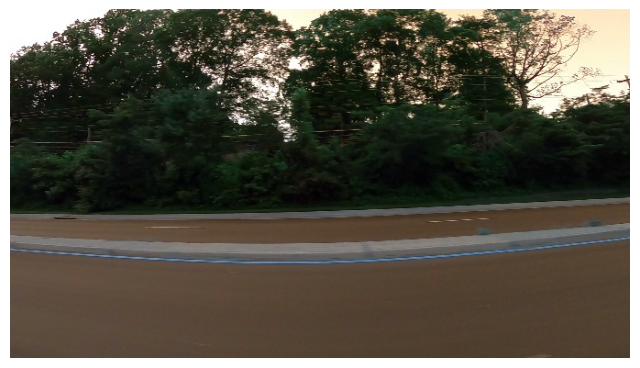


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29820.jpg: 384x640 1 car, 17.1ms
Speed: 2.7ms preprocess, 17.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


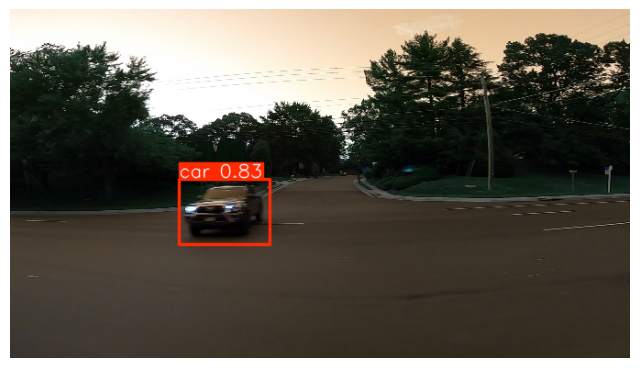


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_29580.jpg: 384x640 1 car, 12.4ms
Speed: 2.6ms preprocess, 12.4ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)


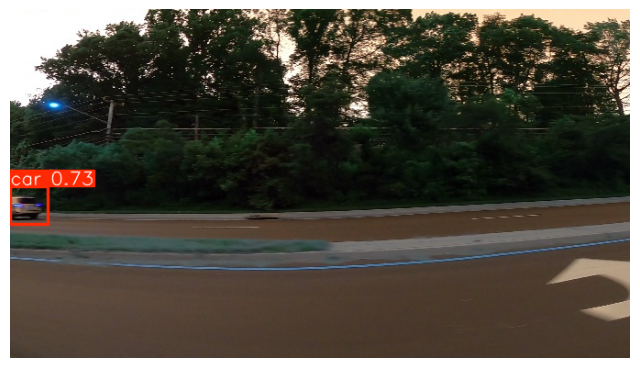


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_30740.jpg: 384x640 1 car, 12.4ms
Speed: 2.7ms preprocess, 12.4ms inference, 4.2ms postprocess per image at shape (1, 3, 384, 640)


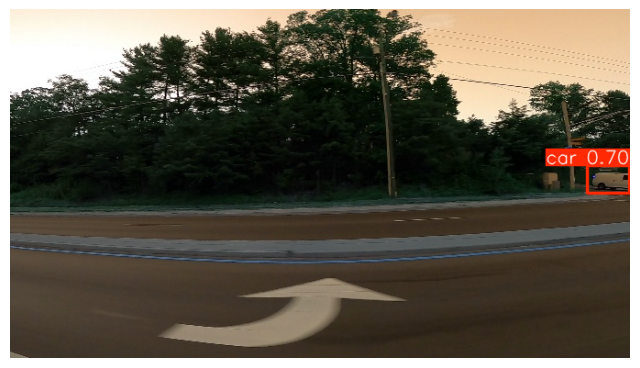


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27500.jpg: 384x640 1 car, 10.8ms
Speed: 2.6ms preprocess, 10.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


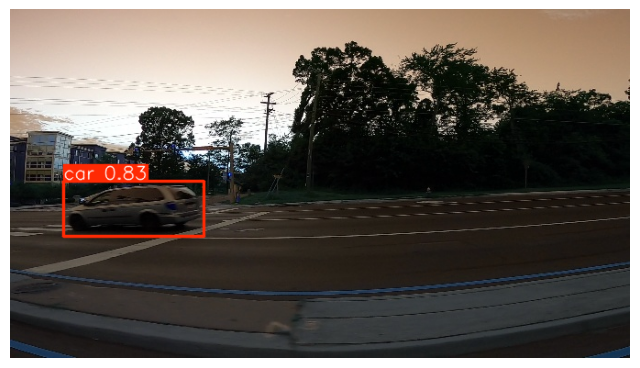


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_26660.jpg: 384x640 1 car, 12.3ms
Speed: 2.7ms preprocess, 12.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)


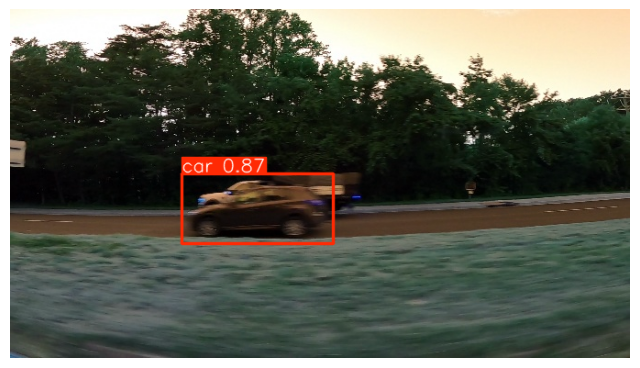


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_31500.jpg: 384x640 (no detections), 11.7ms
Speed: 2.7ms preprocess, 11.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


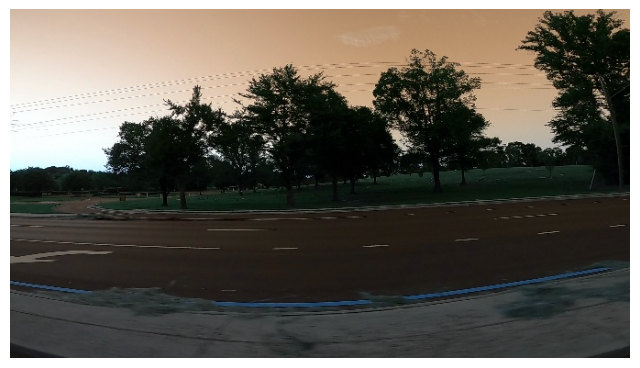


image 1/1 /root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images/vid_5_27520.jpg: 384x640 2 cars, 11.4ms
Speed: 2.6ms preprocess, 11.4ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


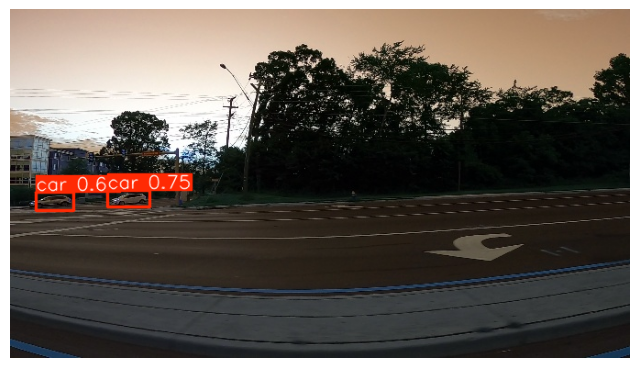

In [ ]:
#Use of test images to predict the car objects using the trained YOLO model

image_dir = "/root/.cache/kagglehub/datasets/sshikamaru/car-object-detection/versions/2/data/testing_images"

all_images = os.listdir(image_dir)
selected_images = all_images[:35]

for img_name in selected_images:
    img_path = os.path.join(image_dir, img_name)
    results = model.predict(img_path)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for result in results:
        plotted_img = result.plot()
        plt.figure(figsize=(8, 6))
        plt.imshow(plotted_img)

        plt.axis('off')
        plt.show()